## Installing dependencies

In [2]:
# libraries
import re
import numpy as np
import pandas as pd
from pymongo import MongoClient
import os, glob
import pickle

## Loading the data 

Custom function 

In [4]:
def load_pickle_to_mongo(file_path, collection):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
        if isinstance(data, list):
            collection.insert_many(data)
        else:
            collection.insert_one(data)

### Connecting to mongo compass

In [5]:
# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']  # Replace with your database name

## Polygon

In [4]:
# Define the path to the folder containing the pickle files
polygonscan = '/Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/polygonscan-data-collection/.data'

#%% Function to load data into MongoDB
def load_pickle_to_mongo(file_path, collection):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
        if isinstance(data, dict):
            # Insert the dictionary directly
            collection.insert_one(data)
        elif isinstance(data, list):
            # Insert each dictionary in the list
            collection.insert_many(data)
        else:
            print(f"Unsupported data type: {type(data)} in file {file_path}")

#%% Connect to MongoDB
# Connect to the localhost
client = MongoClient()

# Create a database
db = client.smm695

# Collection
polygon = db.polygon

# Print connection
print("""
Database
==========
{}

Collection
==========
{}
""".format(db, polygon), flush=True)

#%% Iterate over the pickle files and load them into MongoDB
for f in glob.glob(os.path.join(polygonscan, '*.pickle')):
    load_pickle_to_mongo(f, polygon)

print("Data loading complete.")


Database
Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695')

Collection
Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695'), 'polygon')

Data loading complete.


## Ether

In [5]:
# Define the path to the folder containing the pickle files
etherscan = '/Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/etherscan-data-collection/.data'

# Collection
ether = db.ether

# Print connection
print("""
Database
==========
{}

Collection
==========
{}
""".format(db, ether), flush=True)

#%% Iterate over the pickle files and load them into MongoDB
for f in glob.glob(os.path.join(etherscan, '*.pickle')):
    load_pickle_to_mongo(f, ether)

print("Data loading complete.")


Database
Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695')

Collection
Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695'), 'ether')

Data loading complete.


## Helper function to load data for Dao,Proposals,Follows and votes info

In [6]:
def convert_large_ints(data):
    if isinstance(data, dict):
        return {k: convert_large_ints(v) for k, v in data.items()}
    elif isinstance(data, list):
        return [convert_large_ints(v) for v in data]
    elif isinstance(data, int) and (data > 2**63 - 1 or data < -2**63):
        return str(data)
    else:
        return data


Loading Dao,Proposals,Follows and Votes Info

In [7]:
import os
import glob
import pickle
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']

# Define the path to the folder containing the pickle files
snap_data_base = '/Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data'

dao_info_path = os.path.join(snap_data_base, 'snap_dao_info.pickle')
proposals_path = os.path.join(snap_data_base, 'proposals', '*.pickle')
votes_path = os.path.join(snap_data_base, 'votes', '*.pickle')
follows_path = os.path.join(snap_data_base, 'follow', '*.pickle')

# Collections
dao_collection = db.dao_info
proposal_collection = db.proposals
vote_collection = db.votes
follow_collection = db.follows

# Print connection
print(f"""
Database
==========
{db}

Collections
==========
DAO Info: {dao_collection}
Proposals: {proposal_collection}
Votes: {vote_collection}
Follows: {follow_collection}
""", flush=True)

# Function to convert large integers in the data
def convert_large_ints(data):
    if isinstance(data, dict):
        return {k: convert_large_ints(v) for k, v in data.items()}
    elif isinstance(data, list):
        return [convert_large_ints(v) for v in data]
    elif isinstance(data, int) and (data > 2**63 - 1 or data < -2**63):
        return str(data)
    else:
        return data

# Function to load data from a pickle file into a MongoDB collection
def load_pickle_to_mongo(file_path, collection):
    with open(file_path, 'rb') as file:
        data = pickle.load(file)
        data = convert_large_ints(data)
        # If data is a list, insert multiple documents
        if isinstance(data, list):
            collection.insert_many(data)
        else:
            collection.insert_one(data)
    print(f"Loaded data from {file_path} into {collection.name}", flush=True)

# Load DAO-level info
load_pickle_to_mongo(dao_info_path, dao_collection)

# Load Proposals
for f in glob.glob(proposals_path):
    load_pickle_to_mongo(f, proposal_collection)

# Load Votes
for f in glob.glob(votes_path):
    load_pickle_to_mongo(f, vote_collection)

# Load Follows
for f in glob.glob(follows_path):
    load_pickle_to_mongo(f, follow_collection)

print("Data loading complete.")



Database
Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695')

Collections
DAO Info: Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695'), 'dao_info')
Proposals: Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695'), 'proposals')
Votes: Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695'), 'votes')
Follows: Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'smm695'), 'follows')



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/snap_dao_info.pickle into dao_info
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/proposals/snap_proposals_safe.eth_0.pickle into proposals
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/proposals/snap_proposals_cakevote.eth_2000.pickle into proposals
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/proposals/snap_proposals_bitdao.eth_0.pickle into proposals
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/proposals/snap_proposals_graphprotocol.eth_0.pickle into proposals
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/proposals/snap_proposals_ipistr.eth_0.pickle into proposals
Loaded data from /Users/abhishekroy/D

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_65776.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_64241.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_32770.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_33247.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_31829.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_27081.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_40981.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_22462.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_23155.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_48277.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_49740.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_11593.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_20729.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_19740.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_18277.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_23870.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_41593.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_55755.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_34410.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_132987.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_18388.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_13727.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_29817.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_12210.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/s

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_9896.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_38832.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_61887.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_16295.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_18577.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_19040.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_64882.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_35490.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_131369.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_4434.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_5103.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_57973.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_52374.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_53643.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_43048.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_7090.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_36034.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_131894.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_6221.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_37285.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_57508.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_40897.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_22574.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_23043.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_9180.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_38124.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_39413.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_62999.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_6355.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_7662.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_66117.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_30426.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_31111.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_1482.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_14848.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_16226.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_32702.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_33235.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_65704.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_64233.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_10778.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_29711.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_4489.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_54697.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_8905.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_598.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_16160.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_17457.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_f

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_13291.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_19309.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_21657.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_20360.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_57972.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_35491.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_11800.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_67725.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_66212.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_1787.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_30723.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_31214.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_7496.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_36432.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_37105.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_57688.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_37654.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_36363.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_39254.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_38763.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_61087.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_38032.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_39505.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_9096.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sna

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_27342.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_28197.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_64182.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_10398.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_27413.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/snap_follow_26124.pickle into follows
Loaded data from /Users/abhishekroy/Downloads/vscode folder/dao-data-smm695/snap-data-collection/.data/follow/sn

### Total Collections 

In [7]:
collections = db.list_collection_names()
print("Collections:", collections)


Collections: ['proposals', 'system.views', 'ether', 'polygon', 'dao_info', 'votes', 'follows', 'Ether Collection (Transactions per Block)']


## First Look at the Data

extracting data samples to look at the data structure and to find out the type of data within each nested data structure 

In [8]:
for collection_name in collections:
    collection = db[collection_name]
    sample_data = collection.find_one()
    print(f"Sample data from {collection_name}:", sample_data)


Sample data from proposals: {'_id': ObjectId('66951e51f303dd9c7531af81'), 'data': {'proposals': [{'id': '0x5cf64434792565591b005460db0460e9314753178d4aa5475dfc0ce4d45638a2', 'title': '[SEP 26] [OBRA] Three-Part Research Series on Ethereum Account Abstraction - Ethereum 2077', 'body': "Please refer to the [full proposal text on the SafeDAO forum](https://forum.safe.global/t/sep-26-obra-three-part-research-series-on-ethereum-account-abstraction-ethereum-2077/5105). Some parts may have been removed to fit within the character limit on Snapshot.\n\n## Title: \n[SEP 26] [OBRA] Three-Part Research Series on Ethereum Account Abstraction - Ethereum 2077\n\n## **Authors**: \n@sankritk\n@eawosika\n* Tahira Fatima\n* Maleeha Fatima\n* Okechukwu Wisdom\n\n## **Created**:  \n2024-04-22\n\n## **3. Abstract**\n\nEthereum 2077 requests **30,000 USDC** from Safe DAO to produce a detailed **three-part research series on Ethereum's account abstraction**, focusing on **EIPs 3074, 5003, 7377, and RIP 7560*

In [14]:
# Define a function to print a limited number of documents with specific fields
def print_limited_data(collection_name, limit=1):
    collection = db[collection_name]
    sample_data = collection.find({}, {"_id": 0}).limit(limit)
    for doc in sample_data:
        print(f"Sample data from {collection_name}: {doc}")

# List of collections
collections = ['proposals', 'ether', 'polygon', 'dao_info', 'votes', 'follows']

# Print limited documents from each collection
for collection_name in collections:
    print_limited_data(collection_name, limit=1)


Sample data from proposals: {'data': {'proposals': [{'id': '0x5cf64434792565591b005460db0460e9314753178d4aa5475dfc0ce4d45638a2', 'title': '[SEP 26] [OBRA] Three-Part Research Series on Ethereum Account Abstraction - Ethereum 2077', 'body': "Please refer to the [full proposal text on the SafeDAO forum](https://forum.safe.global/t/sep-26-obra-three-part-research-series-on-ethereum-account-abstraction-ethereum-2077/5105). Some parts may have been removed to fit within the character limit on Snapshot.\n\n## Title: \n[SEP 26] [OBRA] Three-Part Research Series on Ethereum Account Abstraction - Ethereum 2077\n\n## **Authors**: \n@sankritk\n@eawosika\n* Tahira Fatima\n* Maleeha Fatima\n* Okechukwu Wisdom\n\n## **Created**:  \n2024-04-22\n\n## **3. Abstract**\n\nEthereum 2077 requests **30,000 USDC** from Safe DAO to produce a detailed **three-part research series on Ethereum's account abstraction**, focusing on **EIPs 3074, 5003, 7377, and RIP 7560**.\n\nThis initiative will provide the Ethere

In [20]:
collections = ['dao_info', 'ether', 'polygon', 'follows', 'proposals', 'votes']
for collection_name in collections:
    indexes = db[collection_name].index_information()
    print(f"Indexes for {collection_name}: {indexes}")


Indexes for dao_info: {'_id_': {'v': 2, 'key': [('_id', 1)]}, 'dao_id_1': {'v': 2, 'key': [('dao_id', 1)]}, 'name_1': {'v': 2, 'key': [('name', 1)]}, 'creation_date_1': {'v': 2, 'key': [('creation_date', 1)]}, 'data.spaces_1': {'v': 2, 'key': [('data.spaces', 1)]}}
Indexes for ether: {'_id_': {'v': 2, 'key': [('_id', 1)]}, 'blockNumber_1': {'v': 2, 'key': [('blockNumber', 1)]}, 'timeStamp_1': {'v': 2, 'key': [('timeStamp', 1)]}, 'hash_1': {'v': 2, 'key': [('hash', 1)]}, 'address_1': {'v': 2, 'key': [('address', 1)]}, 'time_collected_1': {'v': 2, 'key': [('time_collected', 1)]}}
Indexes for polygon: {'_id_': {'v': 2, 'key': [('_id', 1)]}, 'blockNumber_1': {'v': 2, 'key': [('blockNumber', 1)]}, 'timeStamp_1': {'v': 2, 'key': [('timeStamp', 1)]}, 'hash_1': {'v': 2, 'key': [('hash', 1)]}, 'address_1': {'v': 2, 'key': [('address', 1)]}, 'time_collected_1': {'v': 2, 'key': [('time_collected', 1)]}}
Indexes for follows: {'_id_': {'v': 2, 'key': [('_id', 1)]}, 'user_1': {'v': 2, 'key': [('user

In [22]:
import pandas as pd
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']  # Replace with your database name

# Function to get one sample data point from each collection and save as CSV
def save_sample_data_to_csv(collection_name):
    collection = db[collection_name]
    sample_data = collection.find_one()
    df = pd.DataFrame([sample_data])
    df.to_csv(f'{collection_name}_sample.csv', index=False)
    print(f"Sample data from {collection_name} saved to {collection_name}_sample.csv")

# List of collections
collections = ['dao_info', 'ether', 'polygon', 'follows', 'proposals', 'votes']

# Save sample data from each collection to CSV
for collection_name in collections:
    save_sample_data_to_csv(collection_name)


Sample data from dao_info saved to dao_info_sample.csv
Sample data from ether saved to ether_sample.csv
Sample data from polygon saved to polygon_sample.csv
Sample data from follows saved to follows_sample.csv
Sample data from proposals saved to proposals_sample.csv
Sample data from votes saved to votes_sample.csv


Data loading ends 

### Data Processing begins here

#### Cleaning and stucturing Dao_info

In [128]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['dao_info']

# Remove documents with missing or null values in critical fields
collection.delete_many({"data.spaces.name": {"$exists": False}})
collection.delete_many({"data.spaces.proposalsCount": {"$exists": False}})


DeleteResult({'n': 0, 'ok': 1.0}, acknowledged=True)

### Finding all keys and nested keys 

In [133]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['dao_info']

# Function to recursively find all keys in a dictionary
def find_keys(d, prefix=''):
    keys = []
    for k, v in d.items():
        full_key = f"{prefix}.{k}" if prefix else k
        keys.append(full_key)
        if isinstance(v, dict):
            keys.extend(find_keys(v, full_key))
        elif isinstance(v, list) and v and isinstance(v[0], dict):
            keys.extend(find_keys(v[0], full_key))
    return keys

# Retrieve a sample document
sample_document = collection.find_one()

# Find all keys and nested keys
keys = find_keys(sample_document)

# Print the keys
for key in keys:
    print(key)


_id
data
data.spaces
data.spaces.id
data.spaces.name
data.spaces.rank
data.spaces.email
data.spaces.github
data.spaces.twitter
data.spaces.website
data.spaces.about
data.spaces.network
data.spaces.symbol
data.spaces.strategies
data.spaces.strategies.name
data.spaces.strategies.params
data.spaces.strategies.params.symbol
data.spaces.strategies.params.address
data.spaces.strategies.params.decimals
data.spaces.admins
data.spaces.members
data.spaces.filters
data.spaces.filters.minScore
data.spaces.filters.onlyMembers
data.spaces.plugins
data.spaces.plugins.oSnap
data.spaces.skin
data.spaces.treasuries
data.spaces.treasuries.address
data.spaces.voting
data.spaces.voting.delay
data.spaces.voting.blind
data.spaces.voting.hideAbstain
data.spaces.voting.period
data.spaces.validation
data.spaces.validation.name
data.spaces.validation.params
data.spaces.validation.params.minScore
data.spaces.validation.params.strategies
data.spaces.validation.params.strategies.name
data.spaces.validation.params.s

## generating basic statistics 

In [130]:
pipeline = [
    {"$unwind": "$data.spaces"},
    {"$group": {
        "_id": None,
        "total_proposals": {"$sum": "$data.spaces.proposalsCount"},
        "average_proposals": {"$avg": "$data.spaces.proposalsCount"},
        "min_proposals": {"$min": "$data.spaces.proposalsCount"},
        "max_proposals": {"$max": "$data.spaces.proposalsCount"}
    }}
]

result = list(collection.aggregate(pipeline))
if result:
    stats = result[0]
    print(f"Total proposals: {stats['total_proposals']}")
    print(f"Average proposals: {stats['average_proposals']}")
    print(f"Minimum proposals: {stats['min_proposals']}")
    print(f"Maximum proposals: {stats['max_proposals']}")


Total proposals: 6014
Average proposals: 400.93333333333334
Minimum proposals: 4
Maximum proposals: 3722


### Structuring the data on mongo for dao_info

Grouping based on space.id to get all the data for a space in one data point for all the spaces

In [132]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['dao_info']

# Define the aggregation pipeline
pipeline = [
    {"$unwind": "$data.spaces"},
    {"$group": {
        "_id": "$data.spaces.id",
        "space_name": {"$first": "$data.spaces.name"},
        "proposals_count": {"$sum": "$data.spaces.proposalsCount"},
        "active_proposals": {"$sum": "$data.spaces.activeProposals"},
        "admins": {"$addToSet": "$data.spaces.admins"},
        "strategies": {"$addToSet": "$data.spaces.strategies"},
        "votesCount": {"$sum": "$data.spaces.votesCount"},
        "delegationPortal": {"$addToSet": "$data.spaces.delegationPortal"},
        "members": {"$addToSet": "$data.spaces.members"},
        "filters": {"$addToSet": "$data.spaces.filters"},
        "plugins": {"$addToSet": "$data.spaces.plugins"},
        "skin": {"$addToSet": "$data.spaces.skin"},
        "treasuries": {"$addToSet": "$data.spaces.treasuries"},
        "voting": {"$addToSet": "$data.spaces.voting"},
        "validation": {"$addToSet": "$data.spaces.validation"},
        "parent": {"$addToSet": "$data.spaces.parent"},
    }},
    {"$project": {
        "_id": 0,
        "space_id": "$_id",
        "space_name": 1,
        "proposals_count": 1,
        "active_proposals": 1,
        "admins": 1,
        "strategies": 1,
        "votesCount": 1,
        "delegationPortal": 1,
        "members": 1,
        "filters": 1,
        "plugins": 1,
        "skin": 1,
        "treasuries": 1,
        "voting": 1,
        "validation": 1,
        "parent": 1,
    }}
]

# Aggregate the data
structured_data = list(collection.aggregate(pipeline))

# Save the structured data to a new collection
db['dao_info_structured_grouped'].insert_many(structured_data)

# Confirm the insertion
inserted_count = db['dao_info_structured_grouped'].count_documents({})
print(f"Inserted {inserted_count} documents into dao_info_structured_grouped.")


Inserted 15 documents into dao_info_structured_grouped.


## Polygon

Extracting Keys

In [134]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['proposals']

# Function to recursively find all keys in a dictionary
def find_keys(d, prefix=''):
    keys = []
    for k, v in d.items():
        full_key = f"{prefix}.{k}" if prefix else k
        keys.append(full_key)
        if isinstance(v, dict):
            keys.extend(find_keys(v, full_key))
        elif isinstance(v, list) and v and isinstance(v[0], dict):
            keys.extend(find_keys(v[0], full_key))
    return keys

# Retrieve a sample document
sample_document = collection.find_one()

# Find all keys and nested keys
keys = find_keys(sample_document)

# Print the keys
for key in keys:
    print(key)


_id
data
data.proposals
data.proposals.id
data.proposals.title
data.proposals.body
data.proposals.choices
data.proposals.start
data.proposals.end
data.proposals.snapshot
data.proposals.state
data.proposals.author
data.proposals.created
data.proposals.scores
data.proposals.scores_by_strategy
data.proposals.scores_total
data.proposals.scores_updated
data.proposals.plugins
data.proposals.network
data.proposals.strategies
data.proposals.strategies.name
data.proposals.strategies.network
data.proposals.strategies.params
data.proposals.strategies.params.symbol
data.proposals.strategies.params.address
data.proposals.strategies.params.decimals
data.proposals.space
data.proposals.space.id
data.proposals.space.name


Structuring based on space.id 

In [135]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['proposals']

# Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$data.proposals"
    },
    {
        "$group": {
            "_id": "$data.proposals.space.id",
            "proposals": {
                "$push": {
                    "proposal_id": "$data.proposals.id",
                    "title": "$data.proposals.title",
                    "body": "$data.proposals.body",
                    "choices": "$data.proposals.choices",
                    "start_date": "$data.proposals.start",
                    "end_date": "$data.proposals.end",
                    "snapshot": "$data.proposals.snapshot",
                    "votes": "$data.proposals.votes",
                    "state": "$data.proposals.state",
                    "author": "$data.proposals.author",
                    "created": "$data.proposals.created",
                    "scores": "$data.proposals.scores",
                    "scores_by_strategy": "$data.proposals.scores_by_strategy",
                    "scores_total": "$data.proposals.scores_total",
                    "scores_updated": "$data.proposals.scores_updated",
                    "plugins": "$data.proposals.plugins",
                    "network": "$data.proposals.network",
                    "strategies": "$data.proposals.strategies",
                    "strategies_name": "$data.proposals.strategies.name",
                    "strategies_network": "$data.proposals.strategies.network",
                    "strategies_params": "$data.proposals.strategies.params",
                    "strategies_params_symbol": "$data.proposals.strategies.params.symbol",
                    "strategies_params_address": "$data.proposals.strategies.params.address",
                    "strategies_params_decimals": "$data.proposals.strategies.params.decimals",
                    "space_id": "$data.proposals.space.id",
                    "space_name": "$data.proposals.space.name"
                }
            }
        }
    },
    {
        "$project": {
            "space_id": "$_id",
            "proposals": 1,
            "_id": 0
        }
    }
]

# Execute the aggregation pipeline
structured_data = list(collection.aggregate(pipeline))

# Save the structured data to a new collection
db['proposals_structured'].insert_many(structured_data)

print("Structured data has been saved to the proposals_structured collection.")


Structured data has been saved to the proposals_structured collection.


### Findning keys in Follows

In [137]:
from pymongo import MongoClient
from collections.abc import MutableMapping

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['follows']

# Function to recursively get all keys in a document
def get_all_keys(d, parent_key=''):
    keys = []
    for k, v in d.items():
        new_key = f"{parent_key}.{k}" if parent_key else k
        keys.append(new_key)
        if isinstance(v, MutableMapping):
            keys.extend(get_all_keys(v, new_key))
        elif isinstance(v, list):
            for item in v:
                if isinstance(item, MutableMapping):
                    keys.extend(get_all_keys(item, new_key))
    return keys

# Get a sample document
sample_document = collection.find_one()

# Get all keys
all_keys = get_all_keys(sample_document)

# Remove duplicate keys
all_keys = list(set(all_keys))

# Print all keys
for key in sorted(all_keys):
    print(key)


_id
data
data.follows
data.follows.created
data.follows.follower
data.follows.id
data.follows.ipfs
data.follows.network
data.follows.space
data.follows.space.id


Sturcturing follows based on space.id 

In [138]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['follows']

# Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$data.follows"
    },
    {
        "$group": {
            "_id": "$data.follows.space.id",
            "follows": {
                "$push": {
                    "follow_id": "$data.follows.id",
                    "created": "$data.follows.created",
                    "follower": "$data.follows.follower",
                    "ipfs": "$data.follows.ipfs",
                    "network": "$data.follows.network",
                    "space": {
                        "space_id": "$data.follows.space.id"
                    }
                }
            }
        }
    },
    {
        "$project": {
            "space_id": "$_id",
            "follows": 1,
            "_id": 0
        }
    }
]

# Execute the aggregation pipeline
structured_data = list(collection.aggregate(pipeline))

# Save the structured data to a new collection
db['follows_structured'].insert_many(structured_data)

print("Structured data has been saved to the follows_structured collection.")


Structured data has been saved to the follows_structured collection.


#### Finding all the keys in Votes 

In [141]:
from pymongo import MongoClient
from collections.abc import MutableMapping

# Function to recursively get all keys in a document
def get_all_keys(d, parent_key=''):
    keys = []
    for k, v in d.items():
        new_key = f"{parent_key}.{k}" if parent_key else k
        keys.append(new_key)
        if isinstance(v, MutableMapping):
            keys.extend(get_all_keys(v, new_key))
        elif isinstance(v, list):
            for item in v:
                if isinstance(item, MutableMapping):
                    keys.extend(get_all_keys(item, new_key))
    return keys

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['votes']

# Initialize an empty set to hold all unique keys
all_keys = set()

# Fetch and process multiple documents
for doc in collection.find().limit(100):  # Adjust the limit as needed
    all_keys.update(get_all_keys(doc))

# Print the keys
for key in sorted(all_keys):
    print(key)


_id
data
data.votes
data.votes.choice
data.votes.choice.1
data.votes.choice.2
data.votes.created
data.votes.id
data.votes.proposal
data.votes.proposal.id
data.votes.space
data.votes.space.id
data.votes.voter
data.votes.vp
data.votes.vp_by_strategy
data.votes.vp_state


Structuring votes based on space id 

In [ ]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['votes']

# Ensure an index on the 'votes_structured' collection
db['votes_structured'].create_index([("space_id", 1)], unique=True)

# Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$data.votes"
    },
    {
        "$group": {
            "_id": "$data.votes.space.id",
            "votes": {
                "$push": {
                    "vote_id": "$data.votes.id",
                    "choice": "$data.votes.choice",
                    "created": "$data.votes.created",
                    "proposal_id": "$data.votes.proposal.id",
                    "voter": "$data.votes.voter",
                    "vp": "$data.votes.vp",
                    "vp_by_strategy": "$data.votes.vp_by_strategy",
                    "vp_state": "$data.votes.vp_state"
                }
            }
        }
    },
    {
        "$project": {
            "_id": 0,
            "space_id": "$_id",
            "votes": 1
        }
    },
    {
        "$merge": {
            "into": "votes_structured",
            "on": "space_id",
            "whenMatched": "merge",
            "whenNotMatched": "insert"
        }
    }
]

# Execute the aggregation pipeline
collection.aggregate(pipeline)

print("Structured data has been saved to the votes_structured collection.")


Finding all keys in ether 

In [147]:
from pymongo import MongoClient
from collections.abc import MutableMapping

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['ether']

# Function to recursively get all keys in a document
def get_all_keys(d, parent_key=''):
    keys = []
    for k, v in d.items():
        new_key = f"{parent_key}.{k}" if parent_key else k
        keys.append(new_key)
        if isinstance(v, MutableMapping):
            keys.extend(get_all_keys(v, new_key))
        elif isinstance(v, list):
            for item in v:
                if isinstance(item, MutableMapping):
                    keys.extend(get_all_keys(item, new_key))
    return keys

# Get a sample document to analyze the keys
sample_document = collection.find_one()

# Get all keys and nested keys
keys = get_all_keys(sample_document)

# Print the keys
for key in keys:
    print(key)


_id
address
current_balance
transactons
transactons.blockNumber
transactons.timeStamp
transactons.hash
transactons.nonce
transactons.blockHash
transactons.transactionIndex
transactons.from
transactons.to
transactons.value
transactons.gas
transactons.gasPrice
transactons.isError
transactons.txreceipt_status
transactons.input
transactons.contractAddress
transactons.cumulativeGasUsed
transactons.gasUsed
transactons.confirmations
transactons.methodId
transactons.functionName
transactons.blockNumber
transactons.timeStamp
transactons.hash
transactons.nonce
transactons.blockHash
transactons.transactionIndex
transactons.from
transactons.to
transactons.value
transactons.gas
transactons.gasPrice
transactons.isError
transactons.txreceipt_status
transactons.input
transactons.contractAddress
transactons.cumulativeGasUsed
transactons.gasUsed
transactons.confirmations
transactons.methodId
transactons.functionName
transactons.blockNumber
transactons.timeStamp
transactons.hash
transactons.nonce
transac

Structuring ether based on address

In [148]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['ether']

# Define the aggregation pipeline
pipeline = [
    {
        "$group": {
            "_id": "$address",
            "current_balance": {"$first": "$current_balance"},
            "transactions": {"$push": "$transactons"},
            "erc_20_token_transfers": {"$push": "$erc_20_token_transfer"},
            "erc721_token_transfers": {"$push": "$erc721_token_transfer"},
            "source": {"$first": "$source"},
            "time_collected": {"$first": "$time_collected"}
        }
    },
    {
        "$project": {
            "address": "$_id",
            "_id": 0,
            "current_balance": 1,
            "transactions": {
                "$filter": {
                    "input": "$transactions",
                    "as": "transaction",
                    "cond": {"$ne": ["$$transaction", []]}
                }
            },
            "erc_20_token_transfers": {
                "$filter": {
                    "input": "$erc_20_token_transfers",
                    "as": "transfer",
                    "cond": {"$ne": ["$$transfer", []]}
                }
            },
            "erc721_token_transfers": {
                "$filter": {
                    "input": "$erc721_token_transfers",
                    "as": "transfer",
                    "cond": {"$ne": ["$$transfer", []]}
                }
            },
            "source": 1,
            "time_collected": 1
        }
    }
]

# Execute the aggregation pipeline
structured_data = list(collection.aggregate(pipeline))

# Save the structured data to a new collection
db['ether_structured'].insert_many(structured_data)

print("Structured data has been saved to the ether_structured collection.")


Structured data has been saved to the ether_structured collection.


## Getting all the keys in polygon 

In [149]:
from pymongo import MongoClient
from collections.abc import MutableMapping

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['polygon']

# Function to recursively get all keys in a document
def get_all_keys(d, parent_key=''):
    keys = []
    for k, v in d.items():
        new_key = f"{parent_key}.{k}" if parent_key else k
        keys.append(new_key)
        if isinstance(v, MutableMapping):
            keys.extend(get_all_keys(v, new_key))
        elif isinstance(v, list):
            for item in v:
                if isinstance(item, MutableMapping):
                    keys.extend(get_all_keys(item, new_key))
    return keys

# Fetch a sample document
sample_document = collection.find_one()

# Get all keys
keys = get_all_keys(sample_document)

# Print all keys
print("\n".join(keys))


_id
address
current_balance
transactons
transactons.blockNumber
transactons.timeStamp
transactons.hash
transactons.nonce
transactons.blockHash
transactons.transactionIndex
transactons.from
transactons.to
transactons.value
transactons.gas
transactons.gasPrice
transactons.isError
transactons.txreceipt_status
transactons.input
transactons.contractAddress
transactons.cumulativeGasUsed
transactons.gasUsed
transactons.confirmations
transactons.methodId
transactons.functionName
transactons.blockNumber
transactons.timeStamp
transactons.hash
transactons.nonce
transactons.blockHash
transactons.transactionIndex
transactons.from
transactons.to
transactons.value
transactons.gas
transactons.gasPrice
transactons.isError
transactons.txreceipt_status
transactons.input
transactons.contractAddress
transactons.cumulativeGasUsed
transactons.gasUsed
transactons.confirmations
transactons.methodId
transactons.functionName
transactons.blockNumber
transactons.timeStamp
transactons.hash
transactons.nonce
transac

### Structuring Polygon data based on address 

In [1]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
collection = db['polygon']

# Define the aggregation pipeline
pipeline = [
    {
        "$group": {
            "_id": "$address",
            "current_balance": {"$first": "$current_balance"},
            "transactions": {"$push": "$transactons"},
            "erc_20_token_transfers": {"$push": "$erc_20_token_transfer"},
            "erc721_token_transfers": {"$push": "$erc721_token_transfer"},
            "source": {"$first": "$source"},
            "time_collected": {"$first": "$time_collected"}
        }
    },
    {
        "$project": {
            "address": "$_id",
            "_id": 0,
            "current_balance": 1,
            "transactions": {
                "$filter": {
                    "input": "$transactions",
                    "as": "transaction",
                    "cond": {"$ne": ["$$transaction", []]}
                }
            },
            "erc_20_token_transfers": {
                "$filter": {
                    "input": "$erc_20_token_transfers",
                    "as": "transfer",
                    "cond": {"$ne": ["$$transfer", []]}
                }
            },
            "erc721_token_transfers": {
                "$filter": {
                    "input": "$erc721_token_transfers",
                    "as": "transfer",
                    "cond": {"$ne": ["$$transfer", []]}
                }
            },
            "source": 1,
            "time_collected": 1
        }
    }
]

# Execute the aggregation pipeline
structured_data = list(collection.aggregate(pipeline))

# Save the structured data to a new collection
db['polygon_structured'].insert_many(structured_data)

print("Structured data has been saved to the polygon_structured collection.")


Structured data has been saved to the polygon_structured collection.


### Creating Aggregated fields 

Aggregating dao_info with proposals over space_id

In [3]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
dao_collection = db['dao_info_structured_grouped']
proposals_collection = db['proposals_structured']

# Define the aggregation pipeline
pipeline = [
    {
        "$lookup": {
            "from": "proposals_structured",
            "localField": "space_id",
            "foreignField": "space_id",
            "as": "proposals"
        }
    },
    {
        "$unwind": {
            "path": "$proposals",
            "preserveNullAndEmptyArrays": True
        }
    },
    {
        "$group": {
            "_id": "$space_id",
            "space_name": {"$first": "$space_name"},
            "proposals_count": {"$first": "$proposals_count"},
            "active_proposals": {"$first": "$active_proposals"},
            "strategies": {"$first": "$strategies"},
            "proposals": {"$push": "$proposals.proposals"}
        }
    },
    {
        "$project": {
            "_id": 0,
            "space_id": "$_id",
            "space_name": 1,
            "proposals_count": 1,
            "active_proposals": 1,
            "strategies": 1,
            "proposals": {
                "$filter": {
                    "input": "$proposals",
                    "as": "proposal",
                    "cond": {"$ne": ["$$proposal", None]}
                }
            }
        }
    }
]

# Execute the aggregation pipeline
aggregated_data = list(dao_collection.aggregate(pipeline))

# Save the aggregated data to a new collection
db['dao_proposals_aggregated'].insert_many(aggregated_data)

print("Aggregated data has been saved to the dao_proposals_aggregated collection.")


Aggregated data has been saved to the dao_proposals_aggregated collection.


Aggregating Dao_infowith proposals with follows over space id

In [4]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
dao_proposals_collection = db['dao_proposals_aggregated']
follows_collection = db['follows_structured']

# Define the aggregation pipeline
pipeline = [
    {
        "$lookup": {
            "from": "follows_structured",
            "localField": "space_id",
            "foreignField": "space_id",
            "as": "follows"
        }
    },
    {
        "$unwind": {
            "path": "$follows",
            "preserveNullAndEmptyArrays": True
        }
    },
    {
        "$group": {
            "_id": "$space_id",
            "space_name": {"$first": "$space_name"},
            "proposals_count": {"$first": "$proposals_count"},
            "active_proposals": {"$first": "$active_proposals"},
            "strategies": {"$first": "$strategies"},
            "proposals": {"$first": "$proposals"},
            "follows": {"$push": "$follows.follows"}
        }
    },
    {
        "$project": {
            "_id": 0,
            "space_id": "$_id",
            "space_name": 1,
            "proposals_count": 1,
            "active_proposals": 1,
            "strategies": 1,
            "proposals": 1,
            "follows": {
                "$filter": {
                    "input": "$follows",
                    "as": "follow",
                    "cond": {"$ne": ["$$follow", None]}
                }
            }
        }
    }
]

# Execute the aggregation pipeline
aggregated_data = list(dao_proposals_collection.aggregate(pipeline))

# Save the aggregated data to a new collection
db['dao_proposals_follows_aggregated'].insert_many(aggregated_data)

print("Aggregated data has been saved to the dao_proposals_follows_aggregated collection.")


Aggregated data has been saved to the dao_proposals_follows_aggregated collection.


Aggregating Dao_info, proposals, follows and Votes over Space id 

In [ ]:
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')
db = client['smm695']
dao_proposals_follows_collection = db['dao_proposals_follows_aggregated']
votes_collection = db['votes']

# Define the aggregation pipeline to join votes with dao_proposals_follows_aggregated
pipeline = [
    {
        "$lookup": {
            "from": "votes",
            "let": {"space_id": "$space_id"},
            "pipeline": [
                {"$unwind": "$data.votes"},
                {"$match": {"$expr": {"$eq": ["$data.votes.space.id", "$$space_id"]}}},
                {"$group": {
                    "_id": "$data.votes.space.id",
                    "votes": {"$push": {
                        "vote_id": "$data.votes.id",
                        "choice": "$data.votes.choice",
                        "created": "$data.votes.created",
                        "proposal_id": "$data.votes.proposal.id",
                        "voter": "$data.votes.voter",
                        "vp": "$data.votes.vp",
                        "vp_by_strategy": "$data.votes.vp_by_strategy",
                        "vp_state": "$data.votes.vp_state"
                    }}
                }}
            ],
            "as": "votes_info"
        }
    },
    {
        "$addFields": {
            "votes": {"$arrayElemAt": ["$votes_info.votes", 0]}
        }
    },
    {
        "$project": {
            "votes_info": 0
        }
    }
]

# Execute the aggregation pipeline
aggregated_data = list(dao_proposals_follows_collection.aggregate(pipeline, allowDiskUse=True))

# Save the aggregated data to a new collection
db['dao_proposals_follows_votes_aggregated'].insert_many(aggregated_data)

print("Aggregated data has been saved to the dao_proposals_follows_votes_aggregated collection.")


### Aggregation complete 

In [46]:
from pymongo import MongoClient

# MongoDB connection URI for local host
mongo_uri = "mongodb://localhost:27017/"

# Connect to MongoDB
client = MongoClient(mongo_uri)
db = client['smm695']

# List of collections to inspect
collections = ['dao_info', 'ether', 'final_aggregated_collection', 'follows', 'polygon', 'proposals']

def get_keys(collection_name, sample_size=100):
    """
    Retrieve a sample of documents from the collection and extract keys.
    """
    sample_docs = db[collection_name].aggregate([{"$sample": {"size": sample_size}}])
    keys = set()
    for doc in sample_docs:
        keys.update(doc.keys())
    return keys

# Get keys for each collection
collection_keys = {collection: get_keys(collection) for collection in collections}

# Find common keys across all collections
common_keys = set.intersection(*collection_keys.values())

# Output the keys for each collection and the common keys
for collection, keys in collection_keys.items():
    print(f"Keys in {collection}: {keys}")

print(f"Common keys across all collections: {common_keys}")

# Save the keys to a file for further inspection
with open("collection_keys.txt", "w") as f:
    for collection, keys in collection_keys.items():
        f.write(f"Keys in {collection}: {keys}\n")
    f.write(f"Common keys across all collections: {common_keys}\n")

print("Keys have been saved to collection_keys.txt")


Keys in dao_info: {'_id', 'data'}
Keys in ether: {'erc721_token_transfer', '_id', 'time_collected', 'address', 'erc_20_token_transfer', 'transactons', 'source', 'current_balance'}
Keys in final_aggregated_collection: set()
Keys in follows: {'_id', 'data'}
Keys in polygon: {'erc721_token_transfer', '_id', 'time_collected', 'address', 'erc_20_token_transfer', 'transactons', 'source', 'current_balance'}
Keys in proposals: {'_id', 'data'}
Common keys across all collections: set()
Keys have been saved to collection_keys.txt


In [47]:
from pymongo import MongoClient

# MongoDB connection URI for local host
mongo_uri = "mongodb://localhost:27017/"

# Connect to MongoDB
client = MongoClient(mongo_uri)
db = client['smm695']

# List of collections to analyze
collections = ['dao_info', 'ether', 'final_aggregated_collection', 'follows', 'polygon', 'proposals']

def get_all_keys(document, parent_key='', keys_set=None):
    if keys_set is None:
        keys_set = set()
    if isinstance(document, dict):
        for k, v in document.items():
            new_key = f"{parent_key}.{k}" if parent_key else k
            keys_set.add(new_key)
            get_all_keys(v, new_key, keys_set)
    elif isinstance(document, list):
        for i, item in enumerate(document):
            new_key = f"{parent_key}[{i}]"
            get_all_keys(item, new_key, keys_set)
    return keys_set

def extract_keys_from_collection(collection_name):
    collection = db[collection_name]
    sample_document = collection.find_one()
    if sample_document:
        all_keys = get_all_keys(sample_document)
        return all_keys
    return set()

all_collection_keys = {}

for collection in collections:
    keys = extract_keys_from_collection(collection)
    all_collection_keys[collection] = keys

# Save the keys to a file
with open("nested_collection_keys.txt", "w") as file:
    for collection, keys in all_collection_keys.items():
        file.write(f"Keys in {collection}:\n")
        for key in keys:
            file.write(f"  {key}\n")
        file.write("\n")

print("Keys have been saved to nested_collection_keys.txt")


Keys have been saved to nested_collection_keys.txt


In [48]:
from pymongo import MongoClient

# MongoDB connection URI for local host
mongo_uri = "mongodb://localhost:27017/"

# Connect to MongoDB
client = MongoClient(mongo_uri)
db = client['smm695']

# Define the aggregation pipeline
pipeline = [
    {
        "$project": {
            "space_id": "$data.spaces.id",
            "space_name": "$data.spaces.name",
            "admins": "$data.spaces.admins",
            "proposals_count": "$data.spaces.proposalsCount",
            "strategies": "$data.spaces.strategies"
        }
    },
    {
        "$unwind": "$space_id"
    },
    {
        "$unwind": "$space_name"
    },
    {
        "$unwind": {
            "path": "$admins",
            "preserveNullAndEmptyArrays": True
        }
    },
    {
        "$unwind": {
            "path": "$proposals_count",
            "preserveNullAndEmptyArrays": True
        }
    },
    {
        "$unwind": {
            "path": "$strategies",
            "preserveNullAndEmptyArrays": True
        }
    },
    {
        "$group": {
            "_id": {
                "space_id": "$space_id",
                "space_name": "$space_name"
            },
            "admins": { "$addToSet": "$admins" },
            "total_proposals_count": { "$sum": "$proposals_count" },
            "strategies": { "$addToSet": "$strategies" }
        }
    },
    {
        "$project": {
            "_id": 0,
            "space_id": "$_id.space_id",
            "space_name": "$_id.space_name",
            "admins": 1,
            "total_proposals_count": 1,
            "strategies": 1
        }
    },
    {
        "$out": "dao_admin_activity"
    }
]

# Execute the aggregation pipeline
db.dao_info.aggregate(pipeline)

print("Aggregation completed and saved to 'dao_admin_activity' collection.")


Aggregation completed and saved to 'dao_admin_activity' collection.


In [49]:
# Define the cleaning pipeline
cleaning_pipeline = [
    {
        "$match": {
            "admins": { "$ne": None },
            "total_proposals_count": { "$ne": None },
            "strategies": { "$ne": None }
        }
    },
    {
        "$project": {
            "space_id": 1,
            "space_name": 1,
            "admins": {
                "$filter": {
                    "input": "$admins",
                    "as": "admin",
                    "cond": { "$ne": ["$$admin", None] }
                }
            },
            "total_proposals_count": 1,
            "strategies": {
                "$filter": {
                    "input": "$strategies",
                    "as": "strategy",
                    "cond": { "$ne": ["$$strategy", None] }
                }
            }
        }
    },
    {
        "$out": "dao_admin_activity_cleaned"
    }
]

# Execute the cleaning pipeline
db.dao_admin_activity.aggregate(cleaning_pipeline)

print("Data cleaning completed and saved to 'dao_admin_activity_cleaned' collection.")


Data cleaning completed and saved to 'dao_admin_activity_cleaned' collection.


In [52]:
# Define the cleaning pipeline
cleaning_pipeline = [
    {
        "$match": {
            "admins": { "$ne": None },
            "total_proposals_count": { "$ne": None },
            "strategies": { "$ne": None }
        }
    },
    {
        "$project": {
            "space_id": 1,
            "space_name": 1,
            "admins": {
                "$filter": {
                    "input": "$admins",
                    "as": "admin",
                    "cond": { "$ne": ["$$admin", None] }
                }
            },
            "total_proposals_count": 1,
            "strategies": {
                "$filter": {
                    "input": "$strategies",
                    "as": "strategy",
                    "cond": { "$ne": ["$$strategy", None] }
                }
            }
        }
    },
    {
        "$out": "dao_admin_activity_cleaned"
    }
]

# Execute the cleaning pipeline
db.dao_admin_activity.aggregate(cleaning_pipeline)

print("Data cleaning completed and saved to 'dao_admin_activity_cleaned' collection.")


Data cleaning completed and saved to 'dao_admin_activity_cleaned' collection.


In [61]:
from pymongo import MongoClient

# MongoDB connection URI for local host
mongo_uri = "mongodb://localhost:27017/"

# Connect to MongoDB
client = MongoClient(mongo_uri)
db = client['smm695']  # Replace with your actual database name

# Define batch size
batch_size = 1000  # Adjust the batch size if needed

# Get total document count in dao_info collection
total_documents = db.dao_info.count_documents({})

# Process data in batches to create a new aggregated collection
for skip in range(0, total_documents, batch_size):
    pipeline = [
        {"$skip": skip},
        {"$limit": batch_size},
        {
            "$project": {
                "_id": 1,
                "total_proposals_count": {"$ifNull": [{"$arrayElemAt": ["$data.spaces.proposalsCount", 0]}, 0]},
                "space_id": {"$arrayElemAt": ["$data.spaces.id", 0]},
                "space_name": {"$arrayElemAt": ["$data.spaces.name", 0]},
                "admins": {"$ifNull": [{"$arrayElemAt": ["$data.spaces.admins", 0]}, []]},
                "strategies": {"$ifNull": [{"$arrayElemAt": ["$data.spaces.strategies", 0]}, []]}
            }
        },
        {"$unwind": "$admins"},
        {
            "$merge": {
                "into": "dao_admin_activity_cleaned",
                "whenMatched": "merge",
                "whenNotMatched": "insert"
            }
        }
    ]

    # Execute the aggregation pipeline
    db.dao_info.aggregate(pipeline)
    print(f"Processed batch with skip: {skip}")

print("Batch processing completed.")


Processed batch with skip: 0
Batch processing completed.


### Number of proposals by each dao space:

                         _id             space_name  proposals_count  \
0   66951e51f303dd9c7531af80           Arbitrum DAO              253   
1   66951e51f303dd9c7531af80            PancakeSwap             3722   
2   66951e51f303dd9c7531af80        Shorter Finance                7   
3   66951e51f303dd9c7531af80    Optimism Collective               93   
4   66951e51f303dd9c7531af80                SafeDAO               26   
5   66951e51f303dd9c7531af80                    GMX               31   
6   66951e51f303dd9c7531af80  Mantle (prev. BitDAO)               30   
7   66951e51f303dd9c7531af80                   Aave              618   
8   66951e51f303dd9c7531af80                  Sushi              219   
9   66951e51f303dd9c7531af80                Gitcoin              143   
10  66951e51f303dd9c7531af80                Uniswap              138   
11  66951e51f303dd9c7531af80                    ENS               62   
12  66951e51f303dd9c7531af80              The Graph             

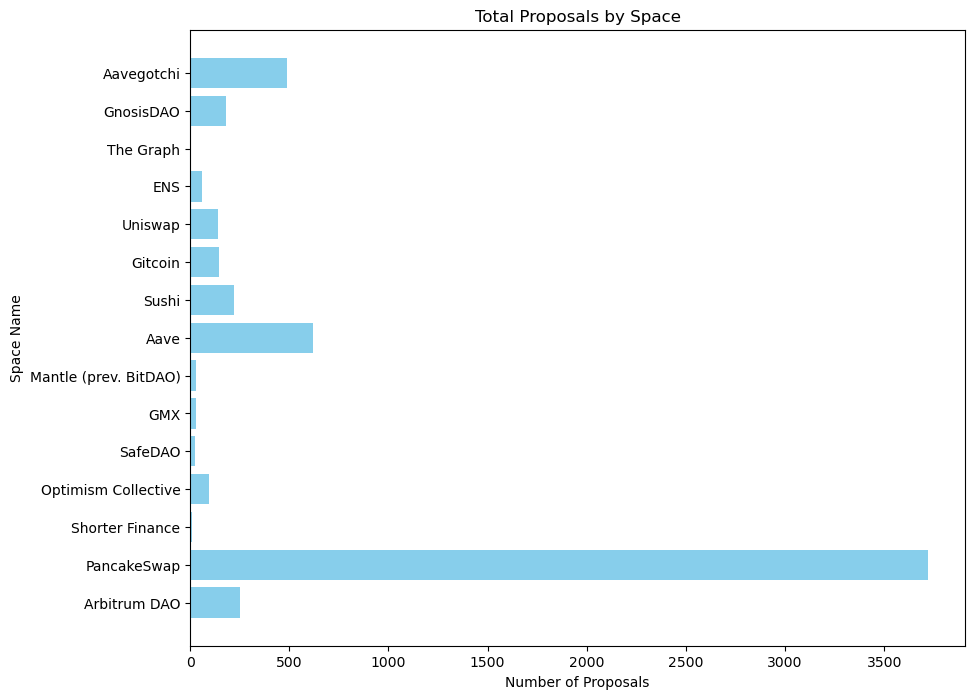

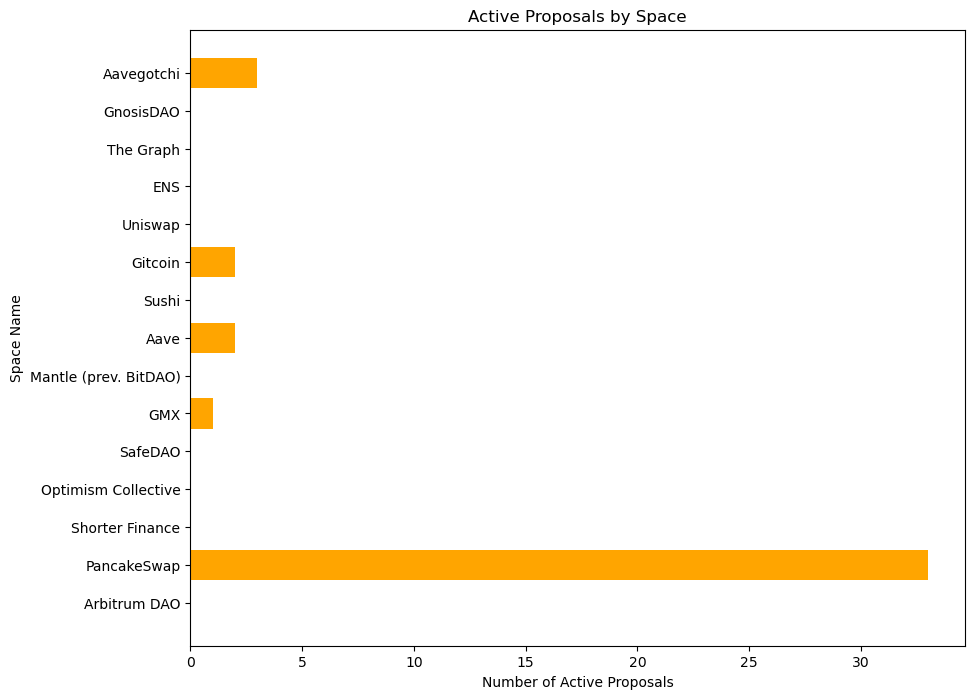

In [79]:
from pymongo import MongoClient
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info']  # Replace with your collection name

# Step 2: Query the Data
pipeline = [
    {
        "$unwind": "$data.spaces"
    },
    {
        "$project": {
            "space_name": "$data.spaces.name",
            "proposals_count": "$data.spaces.proposalsCount",
            "active_proposals_count": "$data.spaces.activeProposals"
        }
    }
]

data = list(collection.aggregate(pipeline))

# Step 3: Convert to DataFrame
df = pd.DataFrame(data)

# Step 4: Print the DataFrame
print(df)

# Step 5: Plot Total Proposals
plt.figure(figsize=(10, 8))
plt.barh(df['space_name'], df['proposals_count'], color='skyblue')
plt.xlabel('Number of Proposals')
plt.ylabel('Space Name')
plt.title('Total Proposals by Space')
plt.show()

# Step 6: Plot Active Proposals
plt.figure(figsize=(10, 8))
plt.barh(df['space_name'], df['active_proposals_count'], color='orange')
plt.xlabel('Number of Active Proposals')
plt.ylabel('Space Name')
plt.title('Active Proposals by Space')
plt.show()


### Number of votes in each Dao Space

                         _id             space_name  votes_count
0   66951e51f303dd9c7531af80           Arbitrum DAO      5036754
1   66951e51f303dd9c7531af80            PancakeSwap       667120
2   66951e51f303dd9c7531af80        Shorter Finance           76
3   66951e51f303dd9c7531af80    Optimism Collective      1144462
4   66951e51f303dd9c7531af80                SafeDAO        18758
5   66951e51f303dd9c7531af80                    GMX       294726
6   66951e51f303dd9c7531af80  Mantle (prev. BitDAO)        67866
7   66951e51f303dd9c7531af80                   Aave      3111674
8   66951e51f303dd9c7531af80                  Sushi        47331
9   66951e51f303dd9c7531af80                Gitcoin       173684
10  66951e51f303dd9c7531af80                Uniswap       299566
11  66951e51f303dd9c7531af80                    ENS       122612
12  66951e51f303dd9c7531af80              The Graph         1195
13  66951e51f303dd9c7531af80              GnosisDAO        43958
14  66951e51f303dd9c7531a

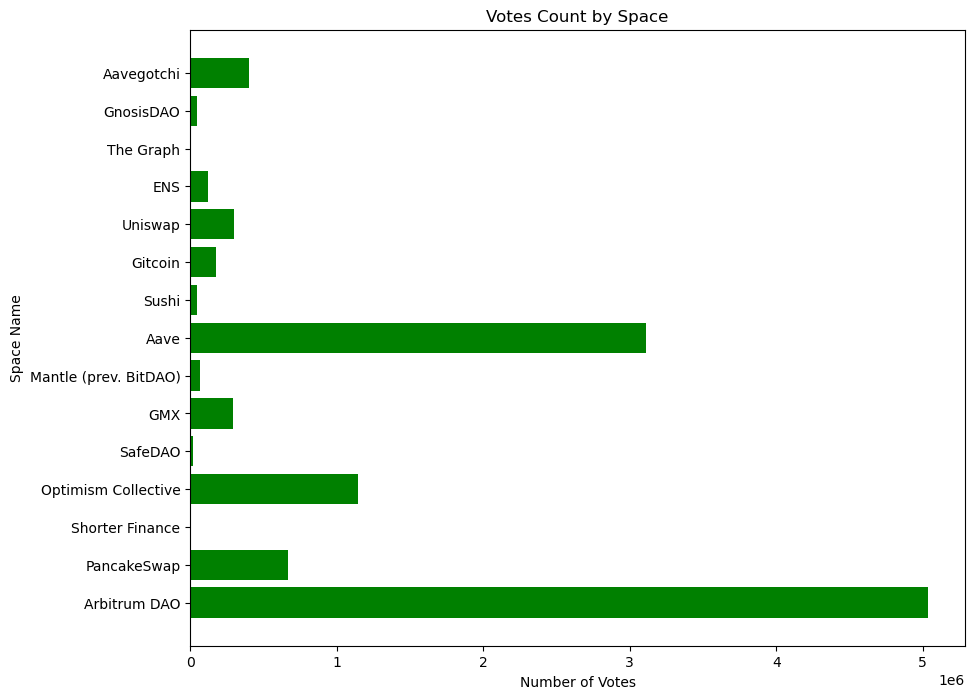

In [80]:
from pymongo import MongoClient
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info']  # Replace with your collection name

# Step 2: Query the Data
pipeline = [
    {
        "$unwind": "$data.spaces"
    },
    {
        "$project": {
            "space_name": "$data.spaces.name",
            "votes_count": "$data.spaces.votesCount"
        }
    }
]

data = list(collection.aggregate(pipeline))

# Step 3: Convert to DataFrame
df = pd.DataFrame(data)

# Step 4: Print the DataFrame
print(df)

# Step 5: Plot Votes Count
plt.figure(figsize=(10, 8))
plt.barh(df['space_name'], df['votes_count'], color='green')
plt.xlabel('Number of Votes')
plt.ylabel('Space Name')
plt.title('Votes Count by Space')
plt.show()


In [81]:
from pymongo import MongoClient
import pandas as pd

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info']  # Replace with your collection name

# Step 2: Query the Data
pipeline = [
    {
        "$unwind": "$data.spaces"
    },
    {
        "$unwind": "$data.spaces.strategies"
    },
    {
        "$project": {
            "space_name": "$data.spaces.name",
            "strategy_name": "$data.spaces.strategies.name"
        }
    }
]

data = list(collection.aggregate(pipeline))

# Step 3: Convert to DataFrame
df = pd.DataFrame(data)

# Step 4: Print the DataFrame
print(df)


                         _id             space_name         strategy_name
0   66951e51f303dd9c7531af80           Arbitrum DAO           erc20-votes
1   66951e51f303dd9c7531af80            PancakeSwap                  cake
2   66951e51f303dd9c7531af80        Shorter Finance      erc20-balance-of
3   66951e51f303dd9c7531af80    Optimism Collective           erc20-votes
4   66951e51f303dd9c7531af80                SafeDAO      erc20-balance-of
5   66951e51f303dd9c7531af80                SafeDAO            delegation
6   66951e51f303dd9c7531af80                SafeDAO           safe-vested
7   66951e51f303dd9c7531af80                SafeDAO         contract-call
8   66951e51f303dd9c7531af80                    GMX      erc20-balance-of
9   66951e51f303dd9c7531af80                    GMX         contract-call
10  66951e51f303dd9c7531af80                    GMX      erc20-balance-of
11  66951e51f303dd9c7531af80                    GMX         contract-call
12  66951e51f303dd9c7531af80          

### Unique Strategy count for each space.

In [22]:
from pymongo import MongoClient
import pandas as pd

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info']  # Replace with your collection name

# Step 2: Query the Data
pipeline = [
    {
        "$unwind": "$data.spaces"
    },
    {
        "$unwind": "$data.spaces.strategies"
    },
    {
        "$group": {
            "_id": "$data.spaces.name",
            "unique_strategies": {"$addToSet": "$data.spaces.strategies.name"}
        }
    },
    {
        "$project": {
            "space_name": "$_id",
            "strategy_count": {"$size": "$unique_strategies"},
            "_id": 0
        }
    }
]

data = list(collection.aggregate(pipeline))

# Step 3: Convert to DataFrame
df = pd.DataFrame(data)

# Step 4: Print the DataFrame
print(df)

# Optional: Print as a formatted table
print(df.to_string(index=False))


               space_name  strategy_count
0                 Gitcoin               3
1                   Sushi               3
2             PancakeSwap               1
3                    Aave               2
4            Arbitrum DAO               1
5                     GMX               2
6               GnosisDAO               2
7     Optimism Collective               1
8                 SafeDAO               4
9              Aavegotchi               1
10        Shorter Finance               1
11              The Graph               3
12                Uniswap               1
13                    ENS               2
14  Mantle (prev. BitDAO)               2
           space_name  strategy_count
              Gitcoin               3
                Sushi               3
          PancakeSwap               1
                 Aave               2
         Arbitrum DAO               1
                  GMX               2
            GnosisDAO               2
  Optimism Collective   

### Calculating the average gas price for all ERC-20 tokens on the Ethereum Blockchain.

In [92]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['ether']  # Replace with your collection name

# Step 2: Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$transactons"  # Unwind the transactions array
    },
    {
        "$unwind": "$erc_20_token_transfer"  # Unwind the erc_20_token_transfer array within transactions
    },
    {
        "$group": {
            "_id": None,  # Group by nothing to get a single result
            "averageGasPrice": { "$avg": { "$toDouble": "$erc_20_token_transfer.gasPrice" } }
        }
    }
]

# Step 3: Execute the aggregation pipeline
result = list(collection.aggregate(pipeline))

# Step 4: Print the result
if result:
    print(f"Average gas price for ERC-20 token transfers: {result[0]['averageGasPrice']}")
else:
    print("No data found.")


Average gas price for ERC-20 token transfers: 22083809846.55901


### Calculating the average gas price for all ERC-721 tokens on the Ethereum Blockchain.

In [86]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['ether']  # Replace with your collection name

# Step 2: Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$transactons"  # Unwind the transactions array
    },
    {
        "$unwind": "$erc721_token_transfer"  # Unwind the erc_20_token_transfer array within transactions
    },
    {
        "$group": {
            "_id": None,  # Group by nothing to get a single result
            "averageGasPrice": { "$avg": { "$toDouble": "$erc721_token_transfer.gasPrice" } }
        }
    }
]

# Step 3: Execute the aggregation pipeline
result = list(collection.aggregate(pipeline))

# Step 4: Print the result
if result:
    print(f"Average gas price for ERC-721 token transfers: {result[0]['averageGasPrice']}")
else:
    print("No data found.")


Average gas price for ERC-721 token transfers: 23837374961.11845


### Calculating the average gas price for all ERC-20 tokens on the Polygon Blockchain.

In [87]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['polygon']  # Replace with your collection name

# Step 2: Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$transactons"  # Unwind the transactions array
    },
    {
        "$unwind": "$erc_20_token_transfer"  # Unwind the erc_20_token_transfer array within transactions
    },
    {
        "$group": {
            "_id": None,  # Group by nothing to get a single result
            "averageGasPrice": { "$avg": { "$toDouble": "$erc_20_token_transfer.gasPrice" } }
        }
    }
]

# Step 3: Execute the aggregation pipeline
result = list(collection.aggregate(pipeline))

# Step 4: Print the result
if result:
    print(f"Average gas price for polygon ERC-20 token transfers: {result[0]['averageGasPrice']}")
else:
    print("No data found.")


Average gas price for polygon ERC-20 token transfers: 71853318695.09108


### Calculating the average gas price for all ERC-721 tokens on the Polygon Blockchain.

In [89]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['polygon']  # Replace with your collection name

# Step 2: Define the aggregation pipeline
pipeline = [
    {
        "$unwind": "$transactons"  # Unwind the transactions array
    },
    {
        "$unwind": "$erc721_token_transfer"  # Unwind the erc_20_token_transfer array within transactions
    },
    {
        "$group": {
            "_id": None,  # Group by nothing to get a single result
            "averageGasPrice": { "$avg": { "$toDouble": "$erc721_token_transfer.gasPrice" } }
        }
    }
]

# Step 3: Execute the aggregation pipeline
result = list(collection.aggregate(pipeline))

# Step 4: Print the result
if result:
    print(f"Average gas price for polygon ERC-721 token transfers: {result[0]['averageGasPrice']}")
else:
    print("No data found.")


Average gas price for polygon ERC-721 token transfers: 137787952095.4913


### Converting all gas prices to USDT for ease of comparison.

In [102]:
import requests

def get_exchange_rate(crypto):
    url = f'https://api.coingecko.com/api/v3/simple/price?ids={crypto}&vs_currencies=usd'
    response = requests.get(url)
    data = response.json()
    if crypto in data and 'usd' in data[crypto]:
        return data[crypto]['usd']
    else:
        raise KeyError(f"'usd' key not found in API response for {crypto}")

try:
    # Fetch exchange rates
    eth_to_usd = get_exchange_rate('ethereum')
    matic_to_usd = get_exchange_rate('matic-network')

    print(f"Current ETH to USDT rate: {eth_to_usd}")
    print(f"Current MATIC to USDT rate: {matic_to_usd}")

    # Average gas prices in Gwei
    average_gas_price_erc20_ether = 22083809846.55901
    average_gas_price_erc721_ether = 23837374961.11845
    average_gas_price_erc20_polygon = 71853318695.09108
    average_gas_price_erc721_polygon = 137787952095.4913

    # Convert Gwei to ETH/MATIC
    average_gas_price_erc20_ether_eth = average_gas_price_erc20_ether * 1e-9
    average_gas_price_erc721_ether_eth = average_gas_price_erc721_ether * 1e-9
    average_gas_price_erc20_polygon_matic = average_gas_price_erc20_polygon * 1e-9
    average_gas_price_erc721_polygon_matic = average_gas_price_erc721_polygon * 1e-9

    # Convert ETH/MATIC to USD
    average_gas_price_erc20_ether_usd = average_gas_price_erc20_ether_eth * eth_to_usd
    average_gas_price_erc721_ether_usd = average_gas_price_erc721_ether_eth * eth_to_usd
    average_gas_price_erc20_polygon_usd = average_gas_price_erc20_polygon_matic * matic_to_usd
    average_gas_price_erc721_polygon_usd = average_gas_price_erc721_polygon_matic * matic_to_usd

    # Print the results
    print(f"Average ERC-20 transaction fee in USDT for Ether: {average_gas_price_erc20_ether_usd}")
    print(f"Average ERC-721 transaction fee in USDT for Ether: {average_gas_price_erc721_ether_usd}")
    print(f"Average ERC-20 transaction fee in USDT for Polygon: {average_gas_price_erc20_polygon_usd}")
    print(f"Average ERC-721 transaction fee in USDT for Polygon: {average_gas_price_erc721_polygon_usd}")

except KeyError as e:
    print(e)
except Exception as e:
    print(f"An error occurred: {e}")


Current ETH to USDT rate: 3380.04
Current MATIC to USDT rate: 0.517094
Average ERC-20 transaction fee in USDT for Ether: 74644.16063376331
Average ERC-721 transaction fee in USDT for Ether: 80571.28086357881
Average ERC-20 transaction fee in USDT for Polygon: 37.15491997731944
Average ERC-721 transaction fee in USDT for Polygon: 71.249323300866


In [105]:
from pymongo import MongoClient
import pandas as pd

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['follows']  # Replace with your collection name

# Step 2: Define the Aggregation Pipeline
pipeline = [
    {
        "$unwind": "$data.follows"
    },
    {
        "$group": {
            "_id": "$data.follows.space.id",
            "follows": {
                "$push": {
                    "id": "$data.follows.id",
                    "ipfs": "$data.follows.ipfs",
                    "follower": "$data.follows.follower",
                    "network": "$data.follows.network",
                    "created": "$data.follows.created"
                }
            }
        }
    },
    {
        "$project": {
            "_id": 0,
            "space_id": "$_id",
            "follows": 1
        }
    },
    {
        "$sort": {"space_id": 1}  # Sorting by space_id in ascending order
    },
    {
        "$out": "follows_grouped"  # Output the result to a new collection
    }
]

# Step 3: Execute the Aggregation Pipeline
collection.aggregate(pipeline)

print("Aggregation complete. The grouped data has been saved to the 'follows_grouped' collection.")


Aggregation complete. The grouped data has been saved to the 'follows_grouped' collection.


In [106]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
follows_grouped_collection = db['follows_grouped']  # The new collection from the previous step
dao_info_collection = db['dao_info']  # The dao_info collection

# Step 2: Define the Aggregation Pipeline
pipeline = [
    {
        "$unwind": "$data.spaces"
    },
    {
        "$lookup": {
            "from": "follows_grouped",
            "localField": "data.spaces.id",
            "foreignField": "space_id",
            "as": "follows_info"
        }
    },
    {
        "$match": {
            "follows_info": {"$ne": []}
        }
    },
    {
        "$project": {
            "_id": 0,
            "space_id": "$data.spaces.id",
            "space_name": "$data.spaces.name",
            "proposals_count": "$data.spaces.proposalsCount",
            "follows_info": 1
        }
    },
    {
        "$out": "dao_info_with_follows"  # Output the result to a new collection
    }
]

# Step 3: Execute the Aggregation Pipeline
dao_info_collection.aggregate(pipeline)

print("Aggregation complete. The combined data has been saved to the 'dao_info_with_follows' collection.")


Aggregation complete. The combined data has been saved to the 'dao_info_with_follows' collection.


In [108]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info_with_follows']  # The new collection from the previous step

# Step 2: Retrieve the first two documents
data_points = collection.find().limit(2)

# Step 3: Check for uniqueness in follows
for idx, doc in enumerate(data_points):
    follows_info = doc.get('follows_info', [])
    
    for follows in follows_info:
        follows_list = follows.get('follows', [])
        
        # Convert each dictionary to a tuple of its items to make it hashable
        follows_tuple_list = [tuple(sorted(follow.items())) for follow in follows_list]
        
        # Check if all follows are unique
        follows_set = set(follows_tuple_list)
        if len(follows_tuple_list) == len(follows_set):
            print(f"Data point {idx + 1}: All follows are unique.")
        else:
            print(f"Data point {idx + 1}: There are duplicate follows.")


Data point 1: All follows are unique.
Data point 2: All follows are unique.


In [112]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info_with_follows']  # The new collection from the previous step

# Step 2: Retrieve and print the space ID, space name, and number of follows
pipeline = [
    {
        "$unwind": "$data.spaces"
    },
    {
        "$project": {
            "space_id": "$space_id",
            "space_name": "$space_name",
            "follows_count": {"$size": "$follows_info.follows"}
        }
    }
]

data = list(collection.aggregate(pipeline))

for entry in data:
    print(f"Space ID: {entry['space_id']}, Space Name: {entry['space_name']}, Number of Follows: {entry['follows_count']}")


In [114]:
from pymongo import MongoClient

# Step 1: Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # Adjust the connection string as needed
db = client['smm695']  # Replace with your database name
collection = db['dao_info_with_follows']  # The new collection from the previous step

# Step 2: Retrieve the space ID, space name, and number of follows
pipeline = [
    {
        "$unwind": "$follows_info"
    },
    {
        "$project": {
            "space_id": "$follows_info.space_id",
            "space_name": "$space_name",
            "follows_count": {"$size": "$follows_info.follows"}
        }
    }
]

data = list(collection.aggregate(pipeline))

# Step 3: Write the result to a text file
with open('space_follows_report.txt', 'w') as file:
    for entry in data:
        file.write(f"Space ID: {entry['space_id']}, Space Name: {entry['space_name']}, Number of Follows: {entry['follows_count']}\n")

print("The report has been saved to 'space_follows_report.txt'.")


The report has been saved to 'space_follows_report.txt'.


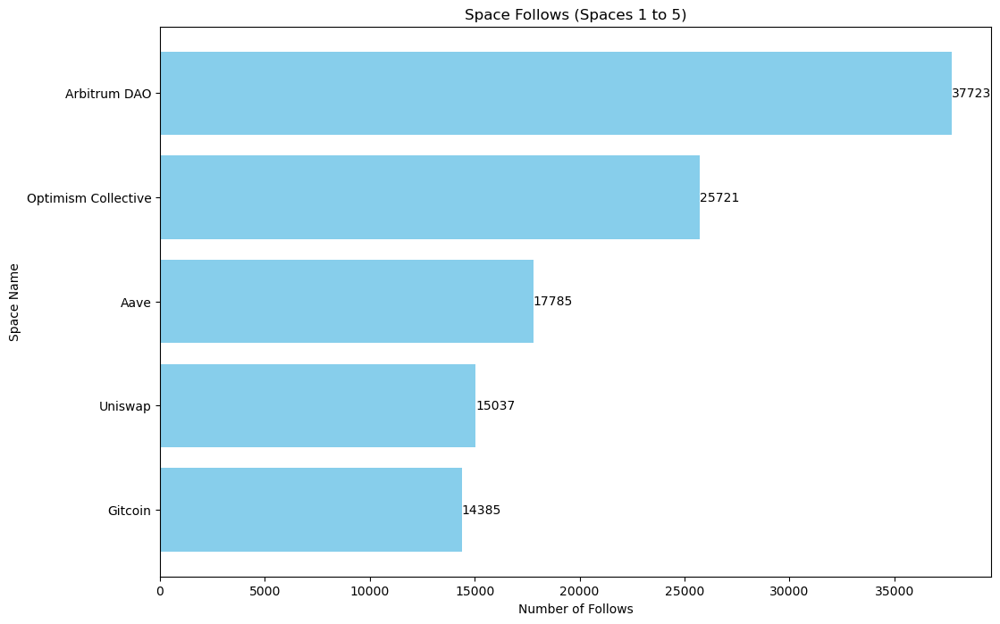

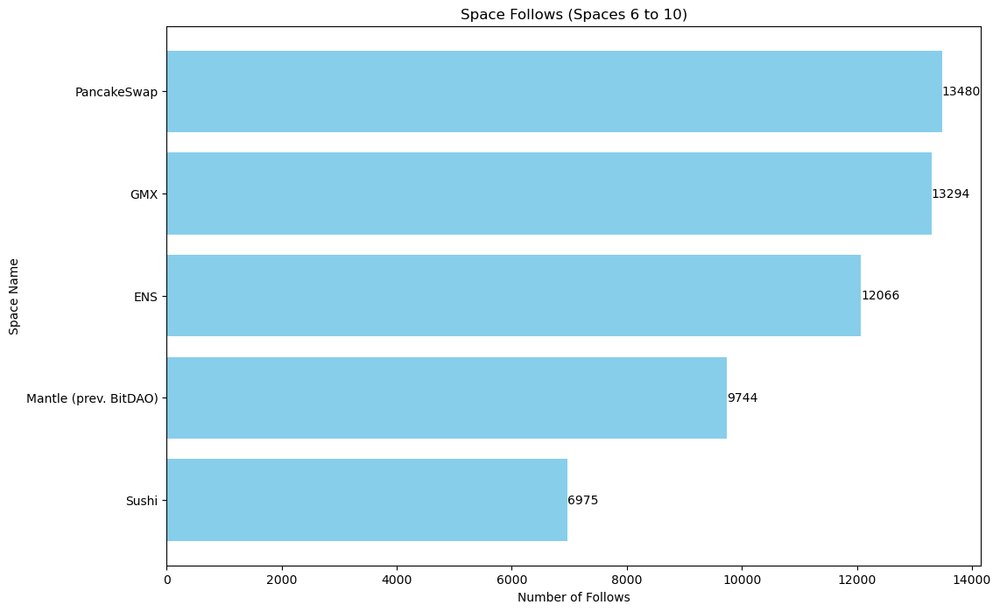

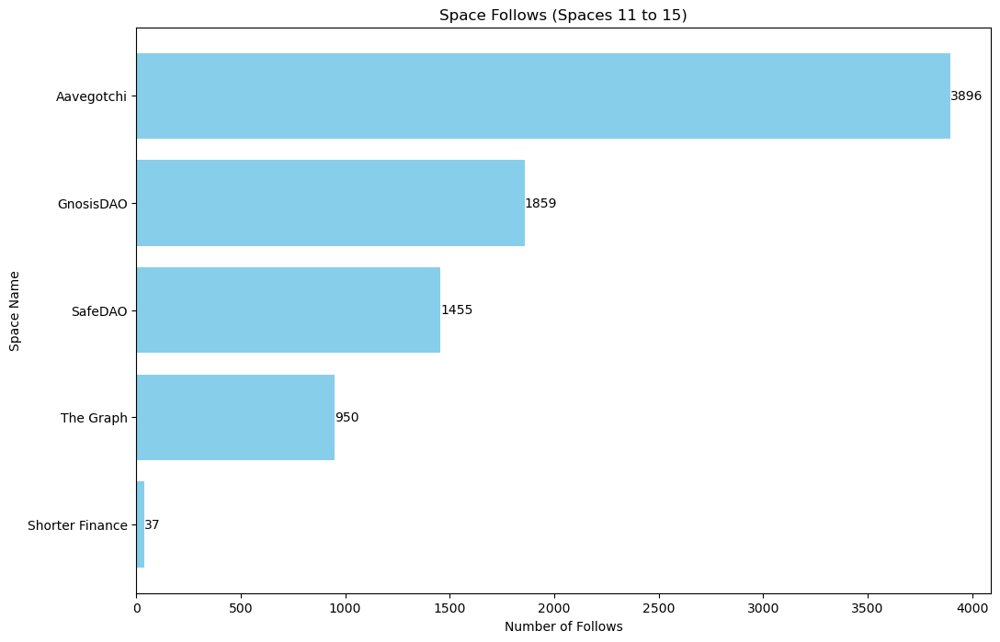

In [115]:
import matplotlib.pyplot as plt
import pandas as pd

# Data
data = [
    {"space_id": "arbitrumfoundation.eth", "space_name": "Arbitrum DAO", "follows_count": 37723},
    {"space_id": "cakevote.eth", "space_name": "PancakeSwap", "follows_count": 13480},
    {"space_id": "ipistr.eth", "space_name": "Shorter Finance", "follows_count": 37},
    {"space_id": "opcollective.eth", "space_name": "Optimism Collective", "follows_count": 25721},
    {"space_id": "safe.eth", "space_name": "SafeDAO", "follows_count": 1455},
    {"space_id": "gmx.eth", "space_name": "GMX", "follows_count": 13294},
    {"space_id": "bitdao.eth", "space_name": "Mantle (prev. BitDAO)", "follows_count": 9744},
    {"space_id": "aave.eth", "space_name": "Aave", "follows_count": 17785},
    {"space_id": "sushigov.eth", "space_name": "Sushi", "follows_count": 6975},
    {"space_id": "gitcoindao.eth", "space_name": "Gitcoin", "follows_count": 14385},
    {"space_id": "uniswapgovernance.eth", "space_name": "Uniswap", "follows_count": 15037},
    {"space_id": "ens.eth", "space_name": "ENS", "follows_count": 12066},
    {"space_id": "graphprotocol.eth", "space_name": "The Graph", "follows_count": 950},
    {"space_id": "gnosis.eth", "space_name": "GnosisDAO", "follows_count": 1859},
    {"space_id": "aavegotchi.eth", "space_name": "Aavegotchi", "follows_count": 3896}
]

# Convert data to DataFrame
df = pd.DataFrame(data)

# Sort data by follows_count in descending order
df = df.sort_values(by="follows_count", ascending=False).reset_index(drop=True)

# Function to plot a subset of data
def plot_follows_subset(df_subset, start_idx):
    plt.figure(figsize=(12, 8))
    bars = plt.barh(df_subset['space_name'], df_subset['follows_count'], color='skyblue')
    plt.xlabel('Number of Follows')
    plt.ylabel('Space Name')
    plt.title(f'Space Follows (Spaces {start_idx + 1} to {start_idx + len(df_subset)})')

    # Add labels on the bars
    for bar in bars:
        plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{int(bar.get_width())}', 
                 va='center', ha='left', fontsize=10)

    plt.gca().invert_yaxis()  # Invert y-axis to have the highest follow count at the top
    plt.show()

# Plot in groups of 5
for i in range(0, len(df), 5):
    plot_follows_subset(df.iloc[i:i+5], i)


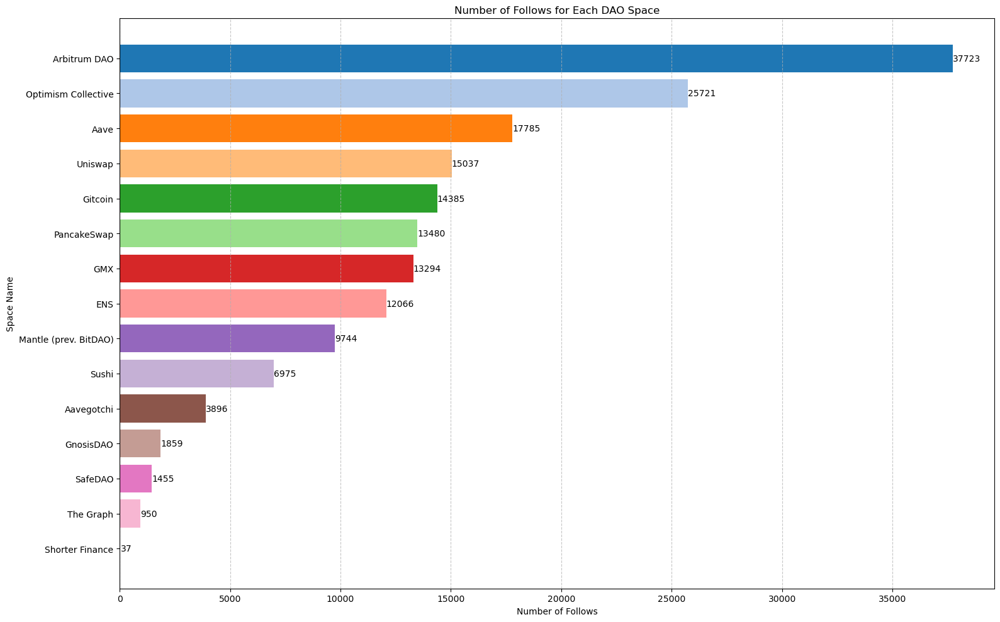

In [116]:
import matplotlib.pyplot as plt
import pandas as pd

# Data
data = [
    {"space_id": "arbitrumfoundation.eth", "space_name": "Arbitrum DAO", "follows_count": 37723},
    {"space_id": "cakevote.eth", "space_name": "PancakeSwap", "follows_count": 13480},
    {"space_id": "ipistr.eth", "space_name": "Shorter Finance", "follows_count": 37},
    {"space_id": "opcollective.eth", "space_name": "Optimism Collective", "follows_count": 25721},
    {"space_id": "safe.eth", "space_name": "SafeDAO", "follows_count": 1455},
    {"space_id": "gmx.eth", "space_name": "GMX", "follows_count": 13294},
    {"space_id": "bitdao.eth", "space_name": "Mantle (prev. BitDAO)", "follows_count": 9744},
    {"space_id": "aave.eth", "space_name": "Aave", "follows_count": 17785},
    {"space_id": "sushigov.eth", "space_name": "Sushi", "follows_count": 6975},
    {"space_id": "gitcoindao.eth", "space_name": "Gitcoin", "follows_count": 14385},
    {"space_id": "uniswapgovernance.eth", "space_name": "Uniswap", "follows_count": 15037},
    {"space_id": "ens.eth", "space_name": "ENS", "follows_count": 12066},
    {"space_id": "graphprotocol.eth", "space_name": "The Graph", "follows_count": 950},
    {"space_id": "gnosis.eth", "space_name": "GnosisDAO", "follows_count": 1859},
    {"space_id": "aavegotchi.eth", "space_name": "Aavegotchi", "follows_count": 3896}
]

# Convert data to DataFrame
df = pd.DataFrame(data)

# Sort data by follows_count in descending order
df = df.sort_values(by="follows_count", ascending=False).reset_index(drop=True)

# Plotting the data
plt.figure(figsize=(16, 10), dpi=100)
bars = plt.barh(df['space_name'], df['follows_count'], color=plt.cm.tab20.colors[:len(df)])

# Set labels and title
plt.xlabel('Number of Follows')
plt.ylabel('Space Name')
plt.title('Number of Follows for Each DAO Space')

# Add text on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{int(bar.get_width())}', 
             va='center', ha='left', fontsize=10, color='black')

# Invert y-axis to have the highest follow count at the top
plt.gca().invert_yaxis()

# Adding grid for better readability
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()
